In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("IPL DATA ANALYSIS").getOrCreate()

In [0]:
from pyspark.sql.types import (
    StructType, StructField,
    IntegerType, StringType, BooleanType, DateType, DecimalType)
from pyspark.sql.functions import *

In [0]:


ball_ball_schema = StructType([
    StructField("match_id",                IntegerType(),  True),
    StructField("over_id",                 IntegerType(),  True),
    StructField("ball_id",                 IntegerType(),  True),
    StructField("innings_no",              IntegerType(),  True),
    StructField("team_batting",            StringType(),   True),
    StructField("team_bowling",            StringType(),   True),
    StructField("striker_batting_position",IntegerType(),  True),
    StructField("extra_type",              StringType(),   True),
    StructField("runs_scored",             IntegerType(),  True),
    StructField("extra_runs",              IntegerType(),  True),
    StructField("wides",                   IntegerType(),  True),
    StructField("legbyes",                 IntegerType(),  True),
    StructField("byes",                    IntegerType(),  True),
    StructField("noballs",                 IntegerType(),  True),
    StructField("penalty",                 IntegerType(),  True),
    StructField("bowler_extras",           IntegerType(),  True),
    StructField("out_type",                StringType(),   True),
    StructField("caught",                  BooleanType(),  True),
    StructField("bowled",                  BooleanType(),  True),
    StructField("run_out",                 BooleanType(),  True),
    StructField("lbw",                     BooleanType(),  True),
    StructField("retired_hurt",            BooleanType(),  True),
    StructField("stumped",                 BooleanType(),  True),
    StructField("caught_and_bowled",       BooleanType(),  True),
    StructField("hit_wicket",              BooleanType(),  True),
    StructField("obstructingfeild",        BooleanType(),  True),
    StructField("bowler_wicket",           BooleanType(),  True),
    StructField("match_date",              DateType(),     True),
    StructField("season",                  IntegerType(),  True),
    StructField("striker",                 IntegerType(),  True),
    StructField("non_striker",             IntegerType(),  True),
    StructField("bowler",                  IntegerType(),  True),
    StructField("player_out",              IntegerType(),  True),
    StructField("fielders",                IntegerType(),  True),
    StructField("striker_match_sk",        IntegerType(),  True),
    StructField("strikersk",               IntegerType(),  True),
    StructField("nonstriker_match_sk",     IntegerType(),  True),
    StructField("nonstriker_sk",           IntegerType(),  True),
    StructField("fielder_match_sk",        IntegerType(),  True),
    StructField("fielder_sk",              IntegerType(),  True),
    StructField("bowler_match_sk",         IntegerType(),  True),
    StructField("bowler_sk",              IntegerType(),  True),
    StructField("playerout_match_sk",      IntegerType(),  True),
    StructField("battingteam_sk",          IntegerType(),  True),
    StructField("bowlingteam_sk",          IntegerType(),  True),
    StructField("keeper_catch",            BooleanType(),  True),
    StructField("player_out_sk",           IntegerType(),  True),
    StructField("matchdatesk",             DateType(),     True)
])


In [0]:
ball_ball_df = spark.read.schema(ball_ball_schema).format("csv").option("header","true").load("s3://ipl-datasets-10/Ball_By_Ball.csv")

In [0]:
ball_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+
|match_id|over_id|ball_id|innings_no|team_batting|team_bowling|striker_batting_position|extra_type|runs_scored|extra_runs|wides|legbyes|byes|noballs|penalty|bowler_extras|      out_type|caught|bowled|run_out| lbw|retired_hurt|stumped|caught_and_bowled|hit_wicket|obstructingfeild|bowler_wicket|match_date|season|striker|non_striker|bowler|player_out|fielders|striker_match_sk|strikersk|nonstriker_match_sk|nonstriker_sk|fielder_match_sk|

In [0]:
match_schema = StructType([
    StructField("match_sk",      IntegerType(), True),
    StructField("match_id",      IntegerType(), True),

    StructField("team1",         StringType(),  True),
    StructField("team2",         StringType(),  True),

    StructField("match_date",    DateType(),    True),
    StructField("season_year",   IntegerType(), True),   # “year” treated as integer

    StructField("venue_name",    StringType(),  True),
    StructField("city_name",     StringType(),  True),
    StructField("country_name",  StringType(),  True),

    StructField("toss_winner",   StringType(),  True),
    StructField("match_winner",  StringType(),  True),
    StructField("toss_name",     StringType(),  True),

    StructField("win_type",      StringType(),  True),
    StructField("outcome_type",  StringType(),  True),
    StructField("manofmach",     StringType(),  True),

    StructField("win_margin",    IntegerType(), True),
    StructField("country_id",    IntegerType(), True)
])

In [0]:
match_df = spark.read.schema(match_schema).format("csv").option("header","true").load("s3://ipl-datasets-10/Match.csv")

In [0]:
match_df.show()

+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-------------+----------+----------+
|match_sk|match_id|               team1|               team2|match_date|season_year|          venue_name| city_name|country_name|         toss_winner|        match_winner|toss_name|win_type|outcome_type|    manofmach|win_margin|country_id|
+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-------------+----------+----------+
|       0|  335987|Royal Challengers...|Kolkata Knight Ri...|      NULL|       2008|M Chinnaswamy Sta...| Bangalore|       India|Royal Challengers...|Kolkata Knight Ri...|    field|    runs|      Result|  BB McCullum|       140|         1|
|       1|  335988|     Kings XI Punjab|

In [0]:
player_schema = StructType([
    StructField("player_sk",     IntegerType(), True),
    StructField("player_id",     IntegerType(), True),
    StructField("player_name",   StringType(),  True),
    StructField("dob",           DateType(),    True),
    StructField("batting_hand",  StringType(),  True),
    StructField("bowling_skill", StringType(),  True),
    StructField("country_name",  StringType(),  True)
])

# ──────────────────────── 2. Player_match.csv ────────────────────
player_match_schema = StructType([
    StructField("player_match_sk",  IntegerType(), True),
    StructField("playermatch_key",  DecimalType(38, 0),               True),  # adjust precision/scale if needed
    StructField("match_id",         IntegerType(), True),
    StructField("player_id",        IntegerType(), True),
    StructField("player_name",      StringType(),  True),
    StructField("dob",              DateType(),    True),
    StructField("batting_hand",     StringType(),  True),
    StructField("bowling_skill",    StringType(),  True),
    StructField("country_name",     StringType(),  True),
    StructField("role_desc",        StringType(),  True),
    StructField("player_team",      StringType(),  True),
    StructField("opposit_team",     StringType(),  True),
    StructField("season_year",      IntegerType(), True),   # “year” treated as int
    StructField("is_manofthematch", BooleanType(), True),
    StructField("age_as_on_match",  IntegerType(), True),
    StructField("isplayers_team_won", BooleanType(), True),
    StructField("batting_status",   StringType(),  True),
    StructField("bowling_status",   StringType(),  True),
    StructField("player_captain",   StringType(),  True),
    StructField("opposit_captain",  StringType(),  True),
    StructField("player_keeper",    StringType(),  True),
    StructField("opposit_keeper",   StringType(),  True)
])

# ───────────────────────── 3. Team.csv ───────────────────────────
team_schema = StructType([
    StructField("team_sk",   IntegerType(), True),
    StructField("team_id",   IntegerType(), True),
    StructField("team_name", StringType(),  True)
])

In [0]:
player_match_df = spark.read.schema(player_match_schema).format("csv").option("header","true").load("s3://ipl-datasets-10/Player_match.csv")
player_df = spark.read.schema(player_schema).format("csv").option("header","true").load("s3://ipl-datasets-10/Player.csv")
team_df = spark.read.schema(team_schema).format("csv").option("header","true").load("s3://ipl-datasets-10/Team.csv")

In [0]:
# player_df.show()    
player_match_df.show()
# team_df.show()

+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+
|player_match_sk|playermatch_key|match_id|player_id|    player_name| dob|  batting_hand|       bowling_skill|country_name|role_desc|         player_team|        opposit_team|season_year|is_manofthematch|age_as_on_match|isplayers_team_won|batting_status|bowling_status|player_captain|opposit_captain|player_keeper|opposit_keeper|
+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+
|            

In [0]:
ball_ball_df = ball_ball_df.filter((col("wides")==0) & (col("legbyes")==0) & (col("byes")==0) & (col("noballs")==0) & (col("penalty")==0) & (col("bowler_extras")==0))
display(ball_ball_df)
# ball_ball_df.show()

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,null,0,null
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,5,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,6,1,5,2,3,No Extras,2,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,13,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,83,null,null,20333,103,20328,5,-1,-1,20343,82,-1,4,1,null,0,null
598028,13,2,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,null,0,null
598028,13,3,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,null,0,null


In [0]:
# total_avg_runs_scored = ball_ball_df.groupBy("match_id","innings_no").agg(
#     sum("runs_scored").alias("total_runs_scored").
#     avg("run_scored").alias("avg_runs_scored"))

# # Aggregation: Calculate the total and average runs scored in each match and inning
total_and_avg_runs = ball_ball_df.groupBy("match_id", "innings_no").agg(
    sum("runs_scored").alias("total_runs"),
    avg("runs_scored").alias("average_runs")
)


In [0]:
from pyspark.sql.window import Window
windowspec = Window.partitionBy("match_id","innings_no").orderBy("over_id")
ball_ball_df = ball_ball_df.withColumn("running_total_of runs", sum("runs_scored").over(windowspec))
ball_ball_df.show()

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+---------------------+
|match_id|over_id|ball_id|innings_no|team_batting|team_bowling|striker_batting_position|extra_type|runs_scored|extra_runs|wides|legbyes|byes|noballs|penalty|bowler_extras|      out_type|caught|bowled|run_out| lbw|retired_hurt|stumped|caught_and_bowled|hit_wicket|obstructingfeild|bowler_wicket|match_date|season|striker|non_striker|bowler|player_out|fielders|striker_match_sk|strikersk|nonstriker_match_sk|nonstrike

In [0]:
ball_ball_df = ball_ball_df.withColumn(
    "high_impact_balls",
    when ((col("runs_scored")+col("extra_runs") > 6 ) | (col("bowler_wicket") == True), True).otherwise(False))
ball_ball_df.show()

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+---------------------+-----------------+
|match_id|over_id|ball_id|innings_no|team_batting|team_bowling|striker_batting_position|extra_type|runs_scored|extra_runs|wides|legbyes|byes|noballs|penalty|bowler_extras|      out_type|caught|bowled|run_out| lbw|retired_hurt|stumped|caught_and_bowled|hit_wicket|obstructingfeild|bowler_wicket|match_date|season|striker|non_striker|bowler|player_out|fielders|striker_match_sk|strikersk|nonstriker_

In [0]:
from pyspark.sql.functions import year, month, dayofmonth, when

# Extracting year, month, and day from the match date for more detailed time-based
# analysis
match_df = match_df.withColumn("year", year("match_date"))
match_df = match_df.withColumn("month", month("match_date"))
match_df = match_df.withColumn("day", dayofmonth("match_date"))

# High margin win: categorizing win margins into 'high', 'medium', and 'low'
match_df = match_df.withColumn(
    "win_margin_category",
    when(col("win_margin") >= 100, "High")
    .when((col("win_margin") >= 50) & (col("win_margin") < 100), "Medium")
    .otherwise("Low")
)

# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn(
    "toss_match_winner",
    when(col("toss_winner") == col("match_winner"), "Yes").otherwise("No")
)

# Show the enhanced match DataFrame
match_df.show()


+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-------------+----------+----------+----+-----+----+-------------------+-----------------+
|match_sk|match_id|               team1|               team2|match_date|season_year|          venue_name| city_name|country_name|         toss_winner|        match_winner|toss_name|win_type|outcome_type|    manofmach|win_margin|country_id|year|month| day|win_margin_category|toss_match_winner|
+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-------------+----------+----------+----+-----+----+-------------------+-----------------+
|       0|  335987|Royal Challengers...|Kolkata Knight Ri...|      NULL|       2008|M Chinnaswamy Sta...| Bangalore|  

In [0]:
from pyspark.sql.functions import lower, regexp_replace

# Normalize and clean player names
player_df = player_df.withColumn("player_name", lower(regexp_replace("player_name", "[^a-zA-Z0-9 ]", "")))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unknown'
player_df = player_df.na.fill({"batting_hand": "unknown", "bowling_skill": "unknown"})

# Categorizing players based on batting hand
player_df = player_df.withColumn(
    "batting_style",
    when(col("batting_hand").contains("left"), "Left-Handed").otherwise("Right-Handed")
)

# Show the modified player DataFrame
player_df.show()


+---------+---------+---------------+----+--------------+--------------------+------------+-------------+
|player_sk|player_id|    player_name| dob|  batting_hand|       bowling_skill|country_name|batting_style|
+---------+---------+---------------+----+--------------+--------------------+------------+-------------+
|        0|        1|     sc ganguly|NULL| Left-hand bat|    Right-arm medium|       India| Right-Handed|
|        1|        2|    bb mccullum|NULL|Right-hand bat|    Right-arm medium| New Zealand| Right-Handed|
|        2|        3|     rt ponting|NULL|Right-hand bat|    Right-arm medium|   Australia| Right-Handed|
|        3|        4|      dj hussey|NULL|Right-hand bat|  Right-arm offbreak|   Australia| Right-Handed|
|        4|        5|mohammad hafeez|NULL|Right-hand bat|  Right-arm offbreak|    Pakistan| Right-Handed|
|        5|        6|       r dravid|NULL|Right-hand bat|  Right-arm offbreak|       India| Right-Handed|
|        6|        7|       w jaffer|NULL|Righ

In [0]:
from pyspark.sql.functions import col, when, current_date, expr

# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn(
    "veteran_status",
    when(col("age_as_on_match") >= 35, "Veteran").otherwise("Non-Veteran")
)

# # Filter to include only players who played the match (excluding bench players)
# player_match_df = player_match_df.filter(col("batting_status") != "Did Not Bat")

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn(
    "years_since_debut",
    (year(current_date()) - col("season_year"))
)

# Show the enriched DataFrame
player_match_df.show()


+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+--------------+-----------------+
|player_match_sk|playermatch_key|match_id|player_id|    player_name| dob|  batting_hand|       bowling_skill|country_name|role_desc|         player_team|        opposit_team|season_year|is_manofthematch|age_as_on_match|isplayers_team_won|batting_status|bowling_status|player_captain|opposit_captain|player_keeper|opposit_keeper|veteran_status|years_since_debut|
+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------

In [0]:
from pyspark.sql.functions import col, when, current_date, expr

# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn(
    "veteran_status",
    when(col("age_as_on_match") >= 35, "Veteran").otherwise("Non-Veteran")
)

# Filter to include only players who played the match (excluding bench players)
# player_match_df = player_match_df.filter(col("batting_status") != "Did Not Bat")

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn(
    "years_since_debut",
    (year(current_date()) - col("season_year"))
)

# Show the enriched DataFrame
player_match_df.show()

+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+--------------+-----------------+
|player_match_sk|playermatch_key|match_id|player_id|    player_name| dob|  batting_hand|       bowling_skill|country_name|role_desc|         player_team|        opposit_team|season_year|is_manofthematch|age_as_on_match|isplayers_team_won|batting_status|bowling_status|player_captain|opposit_captain|player_keeper|opposit_keeper|veteran_status|years_since_debut|
+---------------+---------------+--------+---------+---------------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------

In [0]:
# Register the DataFrames as **session-scoped** temp views
# (works on Databricks SQL Serverless and any cluster tier)

ball_ball_df.createOrReplaceTempView("ball_by_ball")
match_df.createOrReplaceTempView("matchs")
player_df.createOrReplaceTempView("player")
player_match_df.createOrReplaceTempView("player_match")
team_df.createOrReplaceTempView("team")


In [0]:

top_scoring_batsmen_per_season = spark.sql("""
WITH season_totals AS (
    SELECT
        p.player_name,
        m.season_year,
        SUM(b.runs_scored) AS total_runs
    FROM ball_by_ball       b
    JOIN matchs             m  ON b.match_id  = m.match_id
    JOIN player_match       pm ON pm.match_id = b.match_id
                               AND pm.player_id = b.striker     -- striker = batter
    JOIN player             p  ON p.player_id = pm.player_id
    GROUP BY
        p.player_name,
        m.season_year
),
ranked AS (
    SELECT
        season_totals.*,
        ROW_NUMBER() OVER (PARTITION BY season_year
                           ORDER BY total_runs DESC) AS rn
    FROM season_totals
)
SELECT
    player_name,
    season_year,
    total_runs
FROM ranked
WHERE rn = 1                -- keep only the max scorer per season
ORDER BY season_year;
""")

top_scoring_batsmen_per_season.show()


# top_scoring_batsmen_per_season = spark.sql("")


+------------+-----------+----------+
| player_name|season_year|total_runs|
+------------+-----------+----------+
|    se marsh|       2008|       614|
|   ml hayden|       2009|       571|
|sr tendulkar|       2010|       615|
|    ch gayle|       2011|       598|
|    ch gayle|       2012|       720|
|  mek hussey|       2013|       732|
|  rv uthappa|       2014|       659|
|   da warner|       2015|       554|
|     v kohli|       2016|       962|
|   da warner|       2017|       634|
+------------+-----------+----------+



In [0]:
economical_bowlers_powerplay = spark.sql("""
SELECT
    p.player_name,
    AVG(b.runs_scored)                  AS avg_runs_per_ball,
    COUNT(b.bowler_wicket)              AS total_wickets
FROM ball_by_ball        b
JOIN player_match        pm ON  b.match_id = pm.match_id
                              AND b.bowler   = pm.player_id
JOIN player              p  ON  p.player_id = pm.player_id
WHERE  b.over_id <= 6                      -- power-play (overs 1-6)
GROUP BY
    p.player_name
HAVING COUNT(*) > 120                      -- at least 120 balls bowled
ORDER BY
    avg_runs_per_ball,                     -- most economical first
    total_wickets DESC
""")

economical_bowlers_powerplay.show()


+---------------+------------------+-------------+
|    player_name| avg_runs_per_ball|total_wickets|
+---------------+------------------+-------------+
|smsm senanayake|             0.856|            0|
|      sp narine| 0.937246963562753|            0|
|     a chandila| 0.958041958041958|            0|
|     gd mcgrath|0.9627906976744186|            0|
|     sl malinga|0.9639917695473251|            0|
|      r rampaul|             0.975|            0|
|  sohail tanvir|         0.9765625|            0|
|        b kumar|0.9814090019569471|            0|
|       dw steyn|0.9866666666666667|            0|
|       r ashwin|0.9884225759768451|            0|
|      dp nannes|0.9939024390243902|            0|
|  bw hilfenhaus|               1.0|            0|
|   ankit sharma|1.0072463768115942|            0|
|     sm pollock|1.0098522167487685|            0|
|     wpujc vaas|1.0360824742268042|            0|
|  iqbal abdulla|1.0401459854014599|            0|
| m muralitharan| 1.04794520547

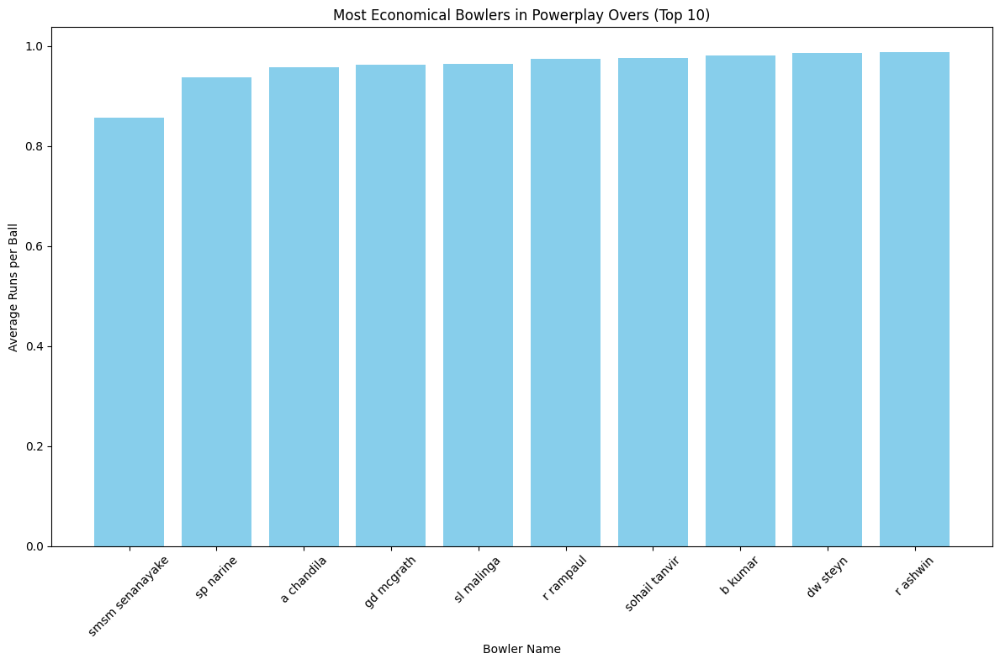

In [0]:
import matplotlib.pyplot as plt

# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib
plt.figure(figsize=(12, 8))

# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')

plt.bar(
    top_economical_bowlers['player_name'],
    top_economical_bowlers['avg_runs_per_ball'],
    color='skyblue'
)
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (Top 10)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


+--------+--------------------+---------+--------------------+-------------+
|match_id|         toss_winner|toss_name|        match_winner|match_outcome|
+--------+--------------------+---------+--------------------+-------------+
|  335987|Royal Challengers...|    field|Kolkata Knight Ri...|         Lost|
|  335988| Chennai Super Kings|      bat| Chennai Super Kings|          Won|
|  335989|    Rajasthan Royals|      bat|    Delhi Daredevils|         Lost|
|  335990|      Mumbai Indians|      bat|Royal Challengers...|         Lost|
|  335991|     Deccan Chargers|      bat|Kolkata Knight Ri...|         Lost|
|  335992|     Kings XI Punjab|      bat|    Rajasthan Royals|         Lost|
|  335993|     Deccan Chargers|      bat|    Delhi Daredevils|         Lost|
|  335994|      Mumbai Indians|    field| Chennai Super Kings|         Lost|
|  335995|    Rajasthan Royals|    field|    Rajasthan Royals|          Won|
|  335996|      Mumbai Indians|    field|     Kings XI Punjab|         Lost|

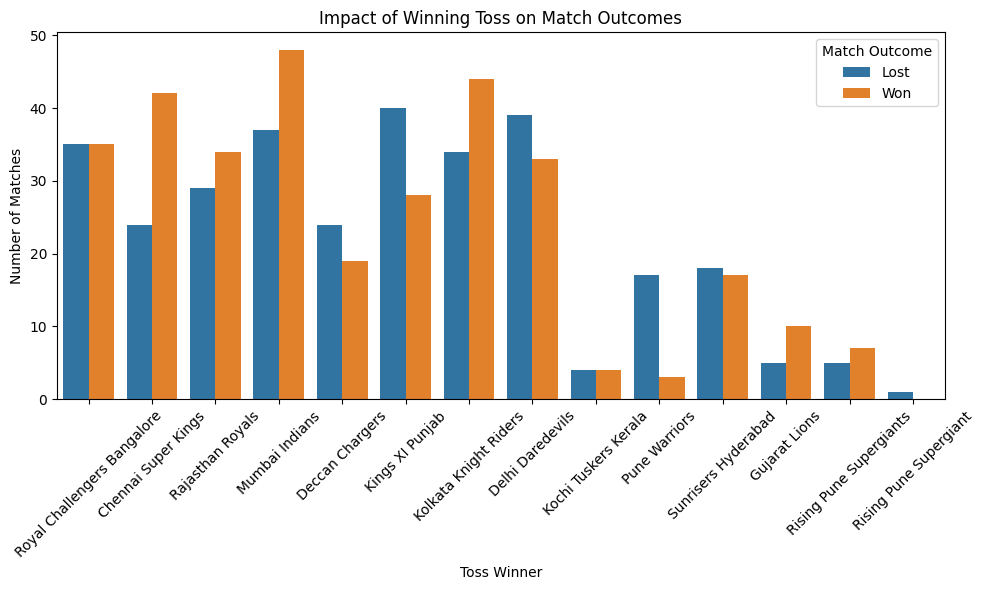

In [0]:
import seaborn as sns

toss_impact_individual_matches = spark.sql("""
SELECT
    m.match_id,
    m.toss_winner,
    m.toss_name,
    m.match_winner,
    CASE
        WHEN m.toss_winner = m.match_winner
             THEN 'Won'
        ELSE 'Lost'
    END AS match_outcome
FROM matchs AS m                -- ← temp-view name you created
WHERE m.toss_name IS NOT NULL    -- ignore matches with no toss info
ORDER BY m.match_id
""")

toss_impact_individual_matches.show()

# Convert the Spark DataFrame to Pandas for plotting
toss_impact_pd = toss_impact_individual_matches.toPandas()

# Creating a countplot to show win/loss after winning the toss
plt.figure(figsize=(10, 6))
sns.countplot(
    x='toss_winner',
    hue='match_outcome',
    data=toss_impact_pd
)
plt.title('Impact of Winning Toss on Match Outcomes')
plt.xlabel('Toss Winner')
plt.ylabel('Number of Matches')
plt.legend(title='Match Outcome')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [0]:
average_runs_in_wins = spark.sql("""
SELECT
    p.player_name,
    AVG(b.runs_scored)                AS avg_runs_in_wins,   -- economy per ball
    COUNT(*)                          AS balls_faced
FROM ball_by_ball        b
JOIN player_match        pm ON  b.match_id  = pm.match_id
                              AND b.striker  = pm.player_id      -- striker = batter
JOIN player              p  ON  p.player_id = pm.player_id
JOIN matchs              m  ON  m.match_id  = pm.match_id
WHERE  m.match_winner = pm.player_team       -- keep only matches the batter’s team won
GROUP BY
    p.player_name
ORDER BY
    avg_runs_in_wins DESC
""")

average_runs_in_wins.show()


+--------------+------------------+-----------+
|   player_name|  avg_runs_in_wins|balls_faced|
+--------------+------------------+-----------+
|   rashid khan|               6.0|          1|
|     vrv singh|               4.0|          1|
| shahid afridi|3.3333333333333335|          6|
|      an ahmed|               3.0|          3|
|      ba bhatt|               3.0|          2|
|      umar gul| 2.727272727272727|         11|
|       pr shah|2.6666666666666665|          3|
|       sn khan|2.5789473684210527|         19|
|    sp jackson|               2.4|          5|
| harmeet singh|2.3333333333333335|          6|
|       ms gony|2.2142857142857144|         28|
|    sm pollock|               2.2|         15|
|     r tewatia| 2.142857142857143|          7|
| cr brathwaite|2.1153846153846154|         26|
|   bcj cutting|2.0697674418604652|         43|
| shivam sharma|               2.0|          2|
|      rs sodhi|               2.0|          2|
|   ds kulkarni|               2.0|     

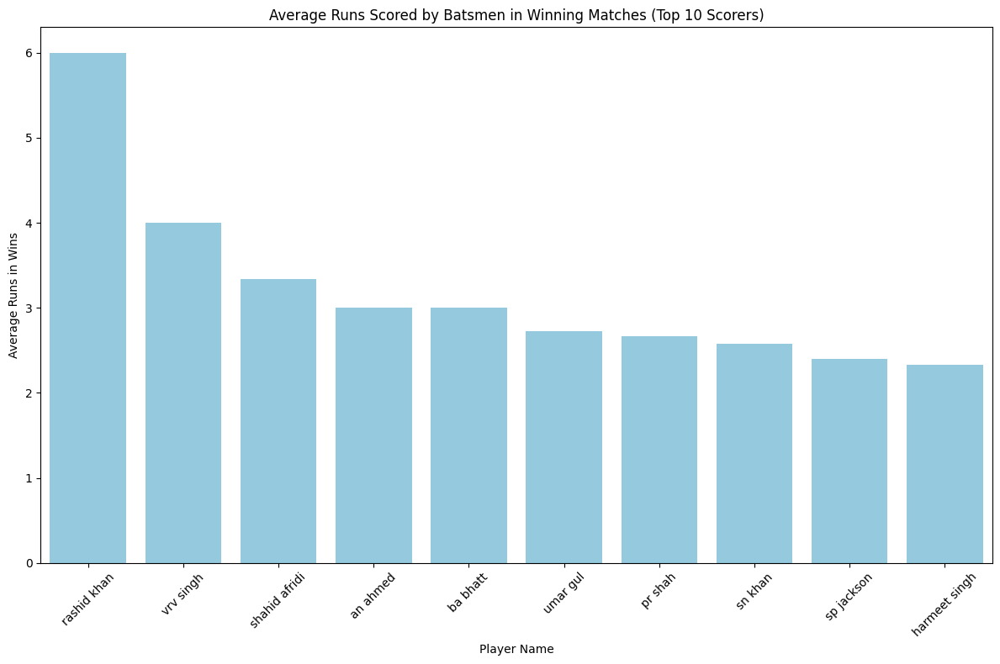

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns   # make sure seaborn is imported

# Convert Spark DataFrame to Pandas
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))

# Keep only the top 10 by average runs (highest first)
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')

sns.barplot(
    x='player_name',
    y='avg_runs_in_wins',
    data=top_scorers,
    color='skyblue'
)

plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [0]:
scores_by_venue = spark.sql("""
SELECT
    venue_name,
    AVG(total_runs) AS average_score,
    MAX(total_runs) AS highest_score
FROM (
    -- aggregate each match’s total runs at its venue
    SELECT
        b.match_id,
        m.venue_name,
        SUM(b.runs_scored) AS total_runs
    FROM ball_by_ball b
    JOIN matchs        m  ON b.match_id = m.match_id
    GROUP BY
        b.match_id,
        m.venue_name
) match_totals
GROUP BY
    venue_name
ORDER BY
    average_score DESC
""")

scores_by_venue.show()


+--------------------+------------------+-------------+
|          venue_name|     average_score|highest_score|
+--------------------+------------------+-------------+
|   Brabourne Stadium| 325.8181818181818|          399|
|Saurashtra Cricke...|             319.1|          393|
|Punjab Cricket As...|317.42857142857144|          341|
|    Barabati Stadium|311.57142857142856|          404|
|          Green Park|             308.0|          378|
|Maharashtra Crick...|302.06666666666666|          377|
|Rajiv Gandhi Inte...|             302.0|          365|
|Himachal Pradesh ...| 301.1111111111111|          371|
|MA Chidambaram St...| 299.7291666666667|          447|
|Sardar Patel Stad...|             298.0|          377|
|Punjab Cricket As...|296.77142857142854|          426|
|    Wankhede Stadium| 296.4736842105263|          419|
|Holkar Cricket St...|             296.2|          371|
|Punjab Cricket As...|             296.0|          380|
|M Chinnaswamy Sta...| 292.6969696969697|       

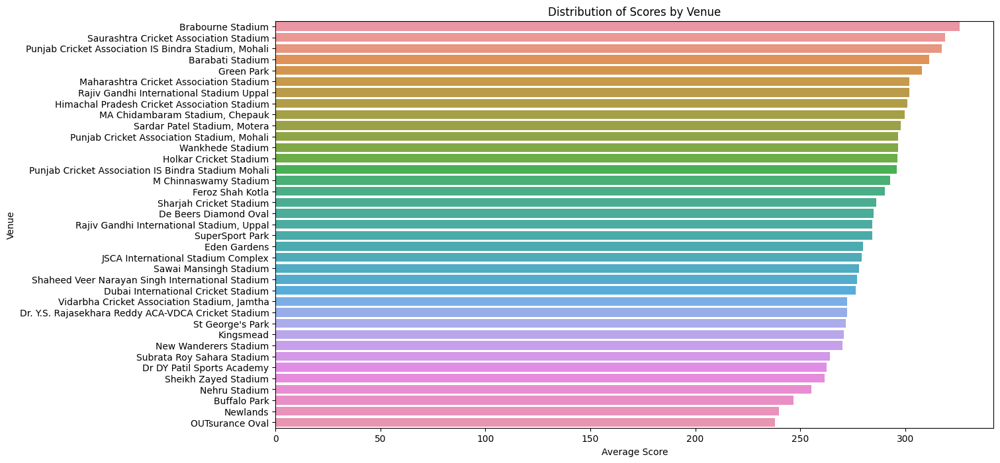

In [0]:
# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)

plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')

plt.show()


In [0]:
dismissal_type = spark.sql("""SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC""")



(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Not Applicable'),
  Text(0, 1, 'caught'),
  Text(0, 2, 'bowled'),
  Text(0, 3, 'run out'),
  Text(0, 4, 'Keeper Catch'),
  Text(0, 5, 'lbw'),
  Text(0, 6, 'stumped'),
  Text(0, 7, 'caught and bowled'),
  Text(0, 8, 'hit wicket'),
  Text(0, 9, 'retired hurt'),
  Text(0, 10, 'obstructing the field')])

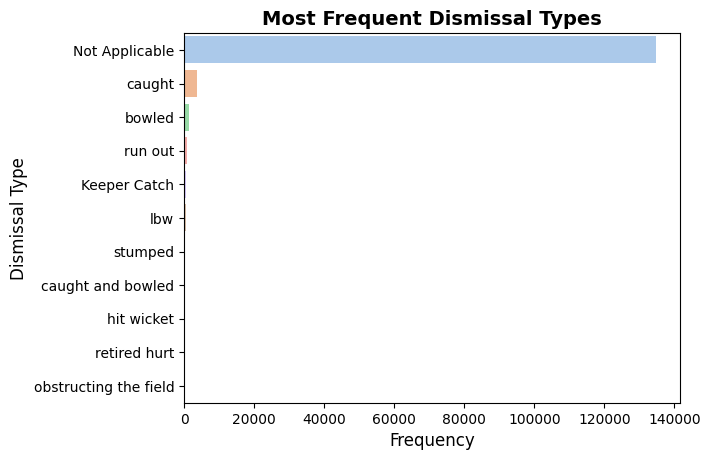

In [0]:
dismissal_type_pd = dismissal_type.toPandas()
sns.barplot(x='frequency', y='out_type', data=dismissal_type_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types', fontsize=14, weight='bold')
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Dismissal Type', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)



In [0]:
# Execute SQL Query
team_toss_win_performance = spark.sql("""
SELECT team1,
       COUNT(*) AS matches_played,
       SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM matchs
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")


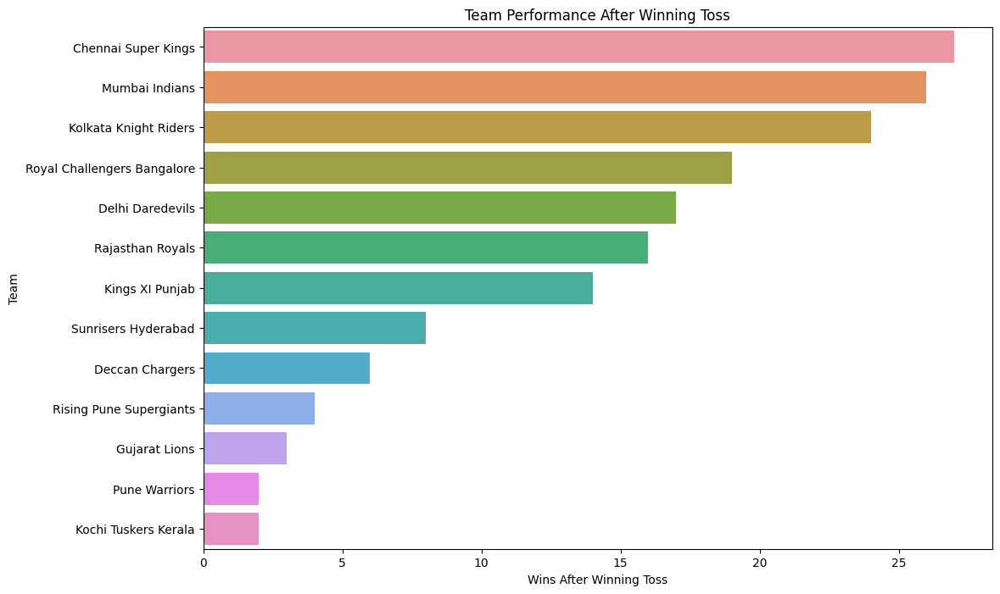

In [0]:
# Convert to Pandas DataFrame
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()
